DRIVE

In [ ]:
# Monta Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Install Visual TCAV

In [1]:
import zipfile

def estrai_zip(file_zip, cartella_destinazione):
    with zipfile.ZipFile(file_zip, 'r') as zip_ref:
        zip_ref.extractall(cartella_destinazione)

# Esempio di utilizzo
#estrai_zip("/content/drive/MyDrive/Tesi_Text2Concept/Datasets/imagenet_1k/imagenet1k_50.zip", "/content/drive/MyDrive/Tesi_Text2Concept/Datasets/imagenet_1k/imagenet1k_50")

In [2]:
import os
def list_files_in_directory(directory):
    """
    Restituisce la lista dei nomi dei file presenti nella cartella specificata.

    :param directory: Percorso della cartella.
    :return: Lista dei nomi dei file nella cartella.
    """
    try:
        return [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
    except FileNotFoundError:
        print("La cartella specificata non esiste.")
        return []
    except PermissionError:
        print("Permesso negato per accedere alla cartella.")
        return []

In [3]:
!pip install pytorchcv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.2/134.2 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 585.2/585.2 kB 47.5 MB/s eta 0:00:00


In [4]:
!git clone https://github.com/DanieleDiSanti/VISUAL_TCAV.git
%cd VISUAL_TCAV

Cloning into 'VISUAL_TCAV'...
remote: Enumerating objects: 1910, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 1910 (delta 40), reused 72 (delta 23), pack-reused 1816 (from 1)
Receiving objects: 100% (1910/1910), 338.88 MiB | 17.70 MiB/s, done.
Resolving deltas: 100% (257/257), done.
/content/VISUAL_TCAV


In [5]:
%cd Tcav
import torch
import torchvision
import numpy as np
from tqdm import tqdm
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

import TorchModel as TorchModel
import VisualTCAV as VisualTCAV
import LocalVisualTCAV as LocalVisualTCAV
from  utils import contraharmonic_mean, cosine_similarity, Predictions, ConceptLayer, Cav
import torch.nn.functional as F
%cd ..


/content/VISUAL_TCAV/Tcav
/content/VISUAL_TCAV


/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:263: SyntaxWarning: invalid escape sequence '\_'
  model_name_esc = self.model.model_name.replace("_", "\_")
/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:269: SyntaxWarning: invalid escape sequence '\_'
  concept_name_esc = concept_name.replace("_", "\_")
/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:274: SyntaxWarning: invalid escape sequence '\m'
  fig.suptitle(f"$\mathit{{{model_name_esc}}}$ architecture\n$\mathit{{{concept_name_esc}}}$ concept",
/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:274: SyntaxWarning: invalid escape sequence '\m'
  fig.suptitle(f"$\mathit{{{model_name_esc}}}$ architecture\n$\mathit{{{concept_name_esc}}}$ concept",
/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:300: SyntaxWarning: invalid escape sequence '\_'
  layer_name_esc = layer_name.replace("_", "\_")
/content/VISUAL_TCAV/Tcav/LocalVisualTCAV.py:338: SyntaxWarning: invalid escape sequence '\m'
  plt.title(f"$\mathit{{{layer_name_esc}}}$ {layer_description}", fo

##Install Text-To-Concept

In [6]:
!pip install  ftfy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 5.4 MB/s eta 0:00:00


In [7]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-yec0vuh6
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-yec0vuh6
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369490 sha256=a8008e0cd75b8fbe3abb310d24091855cf5b3cf20f7f8760d820dce118eee1f3
  Stored in directory: /tmp/pip-ephem-wheel-cache-t3vf_s4y/wheels/35/3e/df/3d24cbfb3b6a06f17a2bfd7d1138900d4365d9028aa8f6e92f
Successfully built clip


In [8]:
%cd Text_to_Concept
#%load_ext autoreload
#%autoreload 2
import torch
import clip
import torchvision
import numpy as np
from tqdm import tqdm
from TextToConcept import TextToConcept
from TextToConcept import LinearAligner
%cd ..

/content/VISUAL_TCAV/Text_to_Concept
/content/VISUAL_TCAV


##Run Visual TCAV

In [9]:
#IMAGENET CLASSES LIST
p = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/Models/RESNET50/ResNet50V2-imagenet-classes.txt'

with open(p, "r") as file:
    lines = file.readlines()
    imgnet_classes = [line.strip() for line in lines if line.strip()]

imgnet_classes.index('crossword_puzzle')

918

In [10]:
layers_dict = {
    'RESNET50': ['layer1', 'layer2', 'layer3', 'layer4'],
    'RESNET18' :['stage1', 'stage2', 'stage3', 'stage4'],
    'VGG_16': ['conv3_3','conv4_3','conv5_3']
}

In [11]:
%cd Tcav
model_names = ['RESNET50','RESNET18','VGG_16']
model_name = model_names[0]
model_path = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/Models/RESNET50_V2/Resnet50.pth'
label_path = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/Models/RESNET50_V2/ResNet50V2-imagenet-classes.txt'
concept_dir = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/concept_images'
cache_dir = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/cache'

concepts = ['striped','dotted','honeycombed','chequered','waffled','zigzagged']
layers = layers_dict[model_name]

test_image_filename = 'zebra.jpg'


model = VisualTCAV.get_model_by_name(model_name, download=True)
tcav = LocalVisualTCAV.LocalVisualTCAV(model=model, test_image_filename=test_image_filename)
tcav.set_concepts(concepts)
tcav.set_layers(layers)

/content/VISUAL_TCAV/Tcav


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 64.2MB/s]


##Predict and Explain

In [12]:
filename = 'zebra.jpg'
tcav.set_test_image(filename)

pred = tcav.predict()
pred.info()

Image,Class name,Confidence
zebra.jpg,zebra,1
,tiger,0.00024
,gazelle,6.1e-05


In [ ]:
tcav.model.activation_generator.batch_size = 5
tcav.explain()

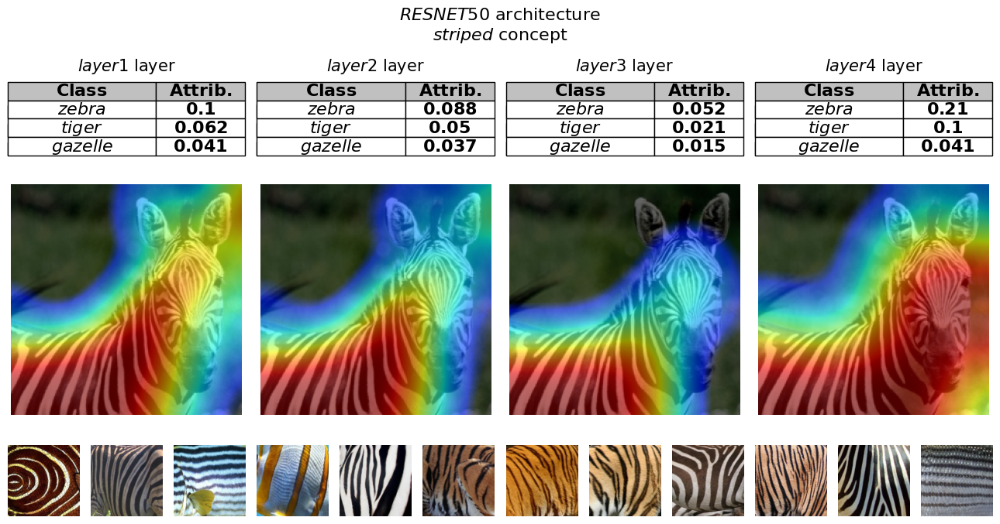

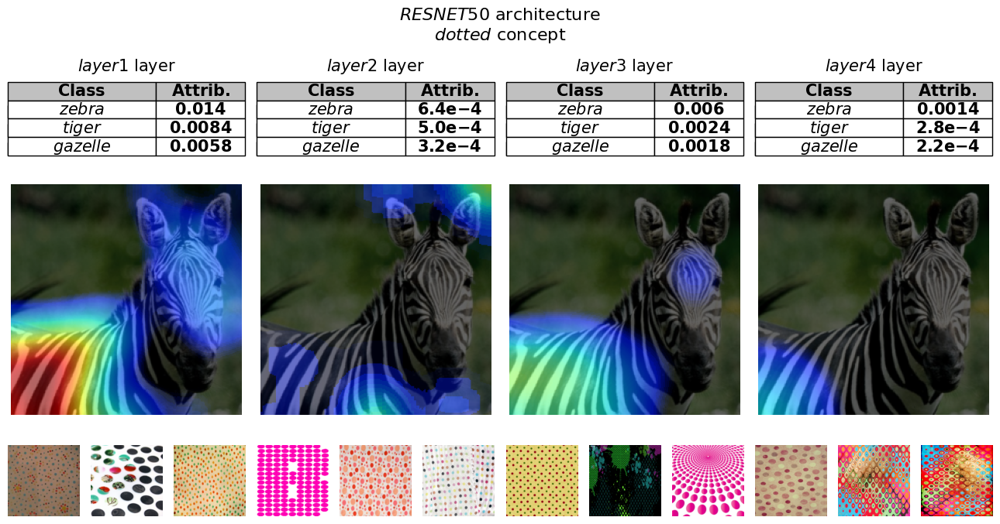

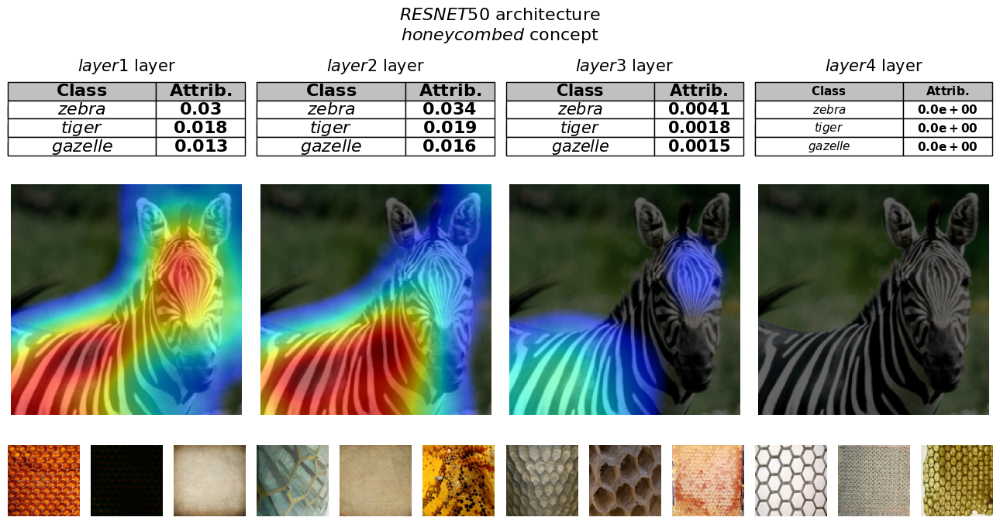

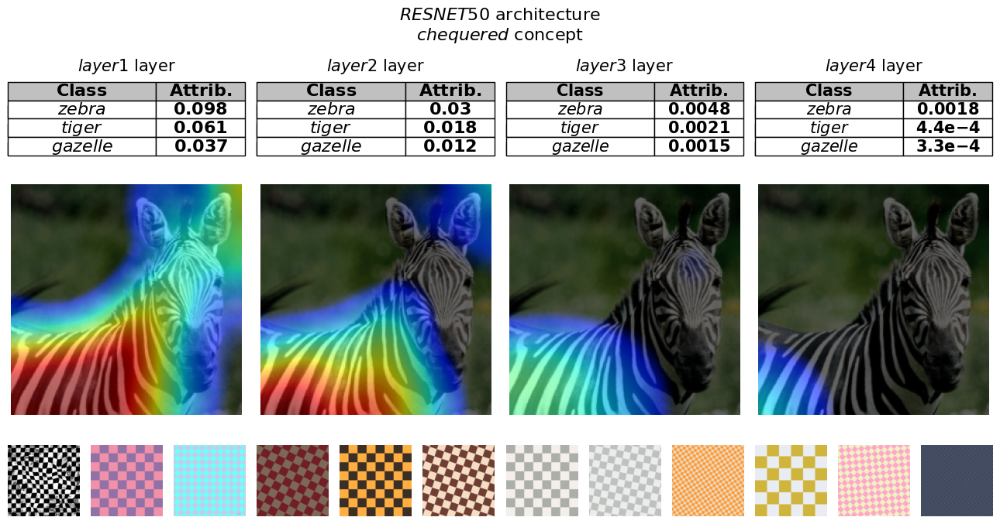

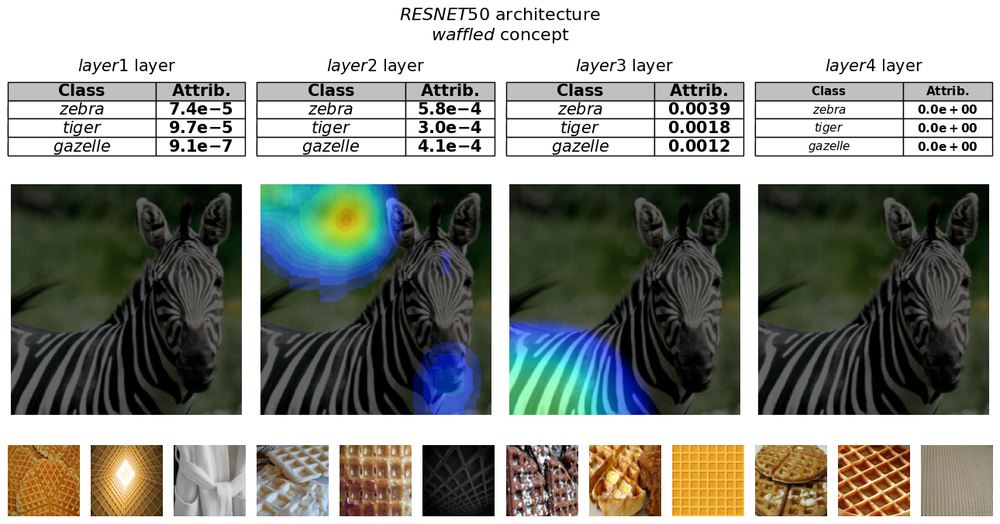

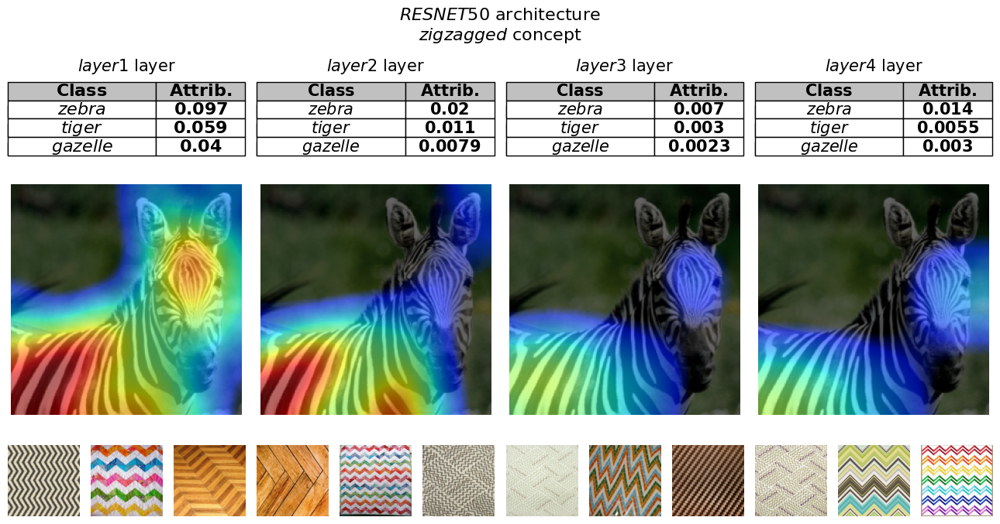

In [ ]:
tcav.plot()

##Extract CAV

In [13]:
def get_activation_vector(test_image_filename, layer):
    tcav.set_test_image(test_image_filename)

    #COMPUTE ACTIVATIONS
    test_image = tcav.resized_img
    #test_image = tcav.model.preprocessing_function(test_image)
    fmap = tcav.model.model_wrapper.get_feature_maps(test_image, layer).detach()
    pooled_activation = fmap.mean(dim=(2, 3)).squeeze()
    return pooled_activation

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def get_activation_vector_from_testFolder(folder_name, layer):
  folder_path = f'/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/test_images/{folder_name}'
  image_folder = tcav.model.activation_generator._load_ImageFolder(folder_path)
  loader = torch.utils.data.DataLoader(image_folder, batch_size=16, shuffle=False, num_workers=2, pin_memory=False)

  fmap = tcav.model.model_wrapper.get_feature_maps(loader, layer).detach()
  pooled_activation = fmap.mean(dim=(2, 3))
  pooled_activation = pooled_activation.mean(dim=0)

  #random_acts = tcav._compute_random(layer).detach()
  #random_acts = random_acts.mean(dim=(2, 3))
  #random_acts = random_acts.mean(dim=0)

  return pooled_activation#.cpu() - random_acts

In [ ]:
def compute_cav(concept, layer):
  random_acts = tcav._compute_random(layer).detach().cpu()
  return tcav._compute_cavs(
          cache=True,
          concept_name=concept,
          layer_name=layer,
          random_acts=random_acts
          )

#CAV DA CLIP

###Text To Concept

Instanzia TextToConcept passando come parametro il modello che stiamo usando


In [15]:
model_name = tcav.model.model_name
text_to_concept = TextToConcept(tcav.model.model_wrapper.model, model_name)

100%|████████████████████████████████████████| 335M/335M [00:01<00:00, 341MiB/s]


Ridefiniamo il metodo foward features che ci restituisce le fmap utili a textToConcept.

Nel nostro caso abbiamo una classe precisa che restituisce le fmap proprie di un particolare layer.

Abbiamo classi diverse per Resnet50 e Resnet18 a causa della divfferente definizione interna dei layer.

In [16]:
layer_name = layers[-1]
feature_model = TorchModel.FeatureMapsModel(text_to_concept.model, layer_name, model_name)
#feature_model = TorchModel.FeatureMapsModel_Resnet18(text_to_concept.model, layer_name, model_name)

text_to_concept.model.forward_features = feature_model.forward
text_to_concept.model.has_normalizer = False
layer_name

'layer4'

In [17]:
#Load Aligner
#text_to_concept.load_linear_aligner('/content/VISUAL_TCAV/Text_to_Concept/aligners/pytorch_resnet50.pth')
text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_v4.pth')
#text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/{model_name}_{layer_name}_v4.pth')

###Train Aligner
Carica il dataset di training, computa il vettore delle features con CLIP, computa le fmap specifiche del layer del modello e fai il pooling in modo che siano un vettore.

Allena un linearAligner a mappare vettore CLIP in vettore modello

####Dataset e computazione features CLIP e features del Modello


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("wenewone/cub2002011")

print("Path to dataset files:", path)

100%|██████████| 1.49G/1.49G [00:16<00:00, 100MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/wenewone/cub2002011/versions/7


In [ ]:
from torchvision import datasets, transforms

def _load_ImageFolder(tcav, images_folder_path, shape=(224, 224), preprocess=True, valid_check=False):
    if tcav.preprocessing_function is not None and preprocess:
        transform = transforms.Compose([
            transforms.Resize(shape, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            tcav.preprocessing_function
        ])

    else:
        transform = transforms.Compose([
            transforms.Resize(shape, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(224),
            transforms.ToTensor()
        ])

    # Carica il dataset utilizzando ImageFolder
    if valid_check:
        x = datasets.ImageFolder(root=images_folder_path, transform=transform, is_valid_file=is_valid_image)
    else:
        x = datasets.ImageFolder(root=images_folder_path, transform=transform)

    return x

In [ ]:
#IMAGENET
import os
import random
from torch.utils.data import DataLoader, Subset


# Carica il dataset senza copiare file
folder_path = "/content/drive/MyDrive/Tesi_Text2Concept/Datasets/imagenet_1k/imagenet1k_50"  # Sostituisci con il percorso corretto
#folder_path = f'{path}/CUB_200_2011/images'
dataset = tcav.model.activation_generator._load_ImageFolder(folder_path)

# Seleziona 25 immagini per classe
def get_subset_indices(dataset, num_per_class=25, first_el=True):
    class_to_indices = {}  # Dizionario per raggruppare indici per classe

    for idx, (_, label) in enumerate(dataset.samples):
        if label not in class_to_indices:
            class_to_indices[label] = []
        class_to_indices[label].append(idx)

    # Seleziona le prime 25 immagini per classe
    selected_indices = []
    for label, indices in class_to_indices.items():
        if first_el:
          selected_indices.extend(indices[:min(num_per_class, len(indices))])
        else:
          selected_indices.extend(indices[-min(num_per_class, len(indices)):])

    return selected_indices

# Ottieni gli indici delle immagini selezionate
subset_indices = get_subset_indices(dataset)

# Crea un sotto-dataset con solo le immagini selezionate
subset_dataset = Subset(dataset, subset_indices)

# Crea il DataLoader
dataloader = DataLoader(subset_dataset, batch_size=16, shuffle=True)

# Controlla il numero di batch
print(f"Numero totale di immagini nel DataLoader: {len(subset_dataset)}")


Numero totale di immagini nel DataLoader: 25000


In [ ]:
dtd_data = subset_dataset
dtd_data

In [ ]:
#Download Dataset DTD
%cd Tcav
import torchvision

d = torchvision.datasets.DTD(
    root= 'dtd',
    partition = 1,
    transform = None,
    target_transform = None,
    download = True
    )

folder_path = '/content/VISUAL_TCAV/Tcav/dtd/dtd/dtd/images/'
dtd_data = tcav.model.activation_generator._load_ImageFolder(folder_path)
dtd_data

[Errno 2] No such file or directory: 'Tcav'
/content/VISUAL_TCAV/Tcav


100%|██████████| 625M/625M [00:07<00:00, 79.7MB/s]


Extracting dtd/dtd/dtd-r1.0.1.tar.gz to dtd/dtd


Dataset ImageFolder
    Number of datapoints: 5640
    Root location: /content/VISUAL_TCAV/Tcav/dtd/dtd/dtd/images/
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               CenterCrop(size=(224, 224))
               ToTensor()
               ImageClassification(
               crop_size=[224]
               resize_size=[232]
               mean=[0.485, 0.456, 0.406]
               std=[0.229, 0.224, 0.225]
               interpolation=InterpolationMode.BILINEAR
           )
           )

In [ ]:
#Memory Safe Ftrs Extraction
from torch.utils.data import DataLoader, Subset
folder = [i for i in range(0,len(dtd_data), 100)]
folder[-1] = len(dtd_data)
reps_model = []

for i in range(1, len(folder)):
  sub = Subset(dtd_data, range(folder[i-1], folder[i]))
  x = torch.utils.data.DataLoader(sub, batch_size=16, shuffle=False, num_workers=2, pin_memory=False)
  x = text_to_concept.model.forward_features(x).detach().cpu()
  x = x.mean(dim=(2, 3)).numpy()
  reps_model.append(x)

reps_model = np.concatenate(reps_model)

In [ ]:
reps_model.shape

(11796, 64)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
#Compute Features
x = torch.utils.data.DataLoader(dtd_data, batch_size=16, shuffle=False, num_workers=2, pin_memory=False)
reps_model = text_to_concept.model.forward_features(x).detach().cpu()
reps_model = reps_model.mean(dim=(2, 3)).numpy()

In [ ]:
reps_clip = text_to_concept.obtain_ftrs(text_to_concept.clip_model, dtd_data)


####Linear Aligner

In [ ]:
text_to_concept.linear_aligner = LinearAligner()

In [ ]:
def get_variance(y: np.ndarray):
    ey = np.mean(y)
    ey2 = np.mean(np.square(y))
    return ey2 - ey**2

In [ ]:
#From CLIP to Model
#var = get_variance(reps_model)
var = 4.5
text_to_concept.linear_aligner.train(reps_clip, reps_model, epochs=100, target_variance=var)
text_to_concept.save_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_vCUB.pth')

Training linear aligner ...
Linear alignment: ((11796, 512)) --> ((11796, 64)).
Initial MSE, R^2: 19.619, -3.360
Final MSE, R^2 = 0.328, 0.927


In [ ]:
#From Model to CLIP
text_to_concept.linear_aligner.train(reps_model,reps_clip, epochs=100, target_variance=4.5)
text_to_concept.save_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/{model_name}_{layer_name}_v4.pth')

Training linear aligner ...
Linear alignment: ((25000, 2048)) --> ((25000, 512)).
Initial MSE, R^2: 7.468, -0.660
Final MSE, R^2 = 1.009, 0.776


###Text CAV
funzioni per costruire il dizionario di CAV da testo.

nome_concetto : cav



In [18]:
original_templates     = ['itap of a {}', 'a bad photo of the {}', 'a origami {}', 'a photo of the large {}',
               'a {} in a video game', 'art of the {}', 'a photo of the small {}']

#templates = ['a photo with the {} cocept','a {} photo','a bad {} photo']

#single_prompt = [f'a photo of {concept}']

templates = original_templates

In [19]:
def get_prompts(concept, templates):
  prompts = [prompt.format(concept) for prompt in templates]
  return prompts

In [20]:
#ottieni il vettore nello spazio di clip
def get_text_cav(text_to_concept, prompts):
  tokens = clip.tokenize(prompts)
  vecs = text_to_concept.clip_model.encode_text(tokens.to(text_to_concept.device))
  vec = vecs.detach().mean(0).float().unsqueeze(0)
  vec /= vec.norm(dim=-1, keepdim=True)
  return vec

In [21]:
#non utile e non usata
def get_clip_image_activations(text_to_concept, img):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  clip_model = text_to_concept.clip_model.clip_model
  x = text_to_concept.clip_model.clip_preprocess(img).unsqueeze(0)
  x = x.to(device)
  x = clip_model.encode_image(x).detach().cpu()
  return x.float()

In [22]:
#non utile e non usata
def get_confidence(prediction, classname, image_name):
  for pred in prediction:
    if pred.class_name == classname:
      return pred.confidence
  print(f'Class {classname} not found in prediction for {image_name}')
  return 0

In [23]:
#costruisci il dizionario concetto_cav:
#per ogni concetto in concepts si calcola il suo vettore nello spazio di clip
#poi si normalizza sottraendo il bias (la baseline)
#infine si mappa nello spazio del modello usando l'aligner.
#baseline2 è usata nel caso si volesse normalizzare dopo l'allineamento (peggiore).
def get_text_cav_dict(concepts, prompt_type='Standard', k=0, when_subtract='Before',
                      templates = None):
  if templates is None:
    templates = ['the image of {}', 'the photo of {}']
  text_cav_dict = {}
  baseline = get_text_cav(text_to_concept, get_prompts('', templates)).detach().cpu()
  baseline_2 = text_to_concept.linear_aligner.get_aligned_representation(baseline.to(device)).detach().cpu()

  for i in range(len(concepts)):
      concept = concepts[i]

      if prompt_type == 'Pure_Word':
          prompts = [concept]

      else:
        prompts = get_prompts(concept, templates)

      text_cav_dict[concept] = get_text_cav(text_to_concept, prompts).detach().cpu()

      if prompt_type == 'Subtract' and when_subtract == 'Before':
        text_cav_dict[concept] = text_cav_dict[concept] - (baseline * k)



      text_cav = text_cav_dict[concept]
      text_cav = text_to_concept.linear_aligner.get_aligned_representation(text_cav.to(device)).detach().cpu()

      if prompt_type == 'Subtract':
        if when_subtract == 'After':
          text_cav = text_cav - baseline_2 * k

      text_cav_dict[concept] = text_cav

  return text_cav_dict

#text_cav_dict = get_text_cav_dict(concept_set)
#print(f'Num of Concepts: {len(text_cav_dict.keys())}')

In [ ]:
cav_dict = { layer_name:
              {concept: compute_cav(concept, layer_name) for concept in concepts}
             for layer_name in layers
           }
cav_dict

####Functions
Funzioni per usare i CAV da testo in V-TCAV: calcolare attribution e concept map

In [24]:
#Calcola le attribution seguendo praticamente le stesse istruzioni di V-TCAV

#ATTRIBUTIONS
#prompt_type : ['Standard', 'Pure_Word', 'Subtract']

import torch.nn.functional as F
import torch.nn as nn



def compute_attribution(object_name,
                        image_name=None,
                        image_index=0,
                        layer_name='layer4',
                        cache=False,
                        text_cav_dict=None,
                        focus=0):

  threshold_relu = nn.Threshold(focus, 0.0)  # Soglia 0.3, valori sotto diventano 0

  concepts_to_test = list(text_cav_dict.keys())

  if image_name is None:
    root = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/test_images/'
    images = list_files_in_directory(f'{root}{object_name}/{object_name}')
    image_name = f'{root}{object_name}/{object_name}/' + images[image_index]

  tcav.set_test_image(image_name)
  pred = tcav.predict()



  attributions = {}
  tcav.computations[layer_name] = {}
  feature_maps = tcav.model.model_wrapper.get_feature_maps(tcav.resized_img,layer_name).detach().cpu()[0]

  for concept_name in concepts_to_test:

      text_cav = text_cav_dict[concept_name]
      concept_layer = ConceptLayer()
      concept_layer.cav = Cav()
      concept_layer.cav.direction = text_cav.squeeze().detach().cpu()


      concept_layer.concept_map = F.relu(torch.sum(concept_layer.cav.direction[:, None, None] * feature_maps, dim=0))


      m = concept_layer.concept_map.min()
      M = concept_layer.concept_map.max()

      concept_layer.concept_map = (concept_layer.concept_map - m) / ((M - m) + 1e-10)
      #concept_layer.concept_map = threshold_relu(concept_layer.concept_map)

      tcav.computations[layer_name][concept_name] = concept_layer


  for n_class in range(tcav.n_classes):

    if not tcav.model.binary_classification:
        logits = tcav.model.model_wrapper.get_logits(feature_maps, layer_name).detach().cpu()[0]
        logits_baseline = tcav.model.model_wrapper.get_logits(torch.zeros_like(feature_maps), layer_name).detach().cpu()[0]

        ig_expected = F.relu(logits - logits_baseline)

        ig_expected_max_value = ig_expected.max()
        ig_expected_norm = ig_expected / ig_expected_max_value if ig_expected_max_value > 0 else ig_expected

        if tcav.target_class is not None:
            ig_expected_class = ig_expected_norm[tcav.target_class_index]
        else:
            ig_expected_class = ig_expected_norm[tcav.predictions[0][n_class].class_index]

    # Compute attributions
    if tcav.target_class is not None:
        ig = tcav._compute_integrated_gradients(feature_maps, layer_name, tcav.target_class_index)
    elif tcav.model.binary_classification:
        ig = tcav._compute_integrated_gradients(feature_maps, layer_name,
                                                tcav.predictions[0][0].class_index)
    else:
        ig = tcav._compute_integrated_gradients(feature_maps, layer_name,
                                                tcav.predictions[0][n_class].class_index)

    if tcav.model.binary_classification:
        binary_attributions = ig * feature_maps
        virtual_logit_0 = torch.sum(F.relu(binary_attributions))
        virtual_logit_1 = torch.sum(F.relu(-binary_attributions))
        max_virtual_logit = max(virtual_logit_0, virtual_logit_1)
        if max_virtual_logit > 0:
            virtual_logit_0 /= max_virtual_logit
            virtual_logit_1 /= max_virtual_logit
        if n_class == 0:
            attributions[n_class] = F.relu(binary_attributions)
            attributions[n_class] = attributions[n_class] * (
                        virtual_logit_0 / (attributions[n_class].sum() + 1e-10))
        else:
            attributions[n_class] = F.relu(-binary_attributions)
            attributions[n_class] = attributions[n_class] * (
                        virtual_logit_1 / (attributions[n_class].sum() + 1e-10))
    else:
        attributions[n_class] = F.relu(ig * feature_maps)
        attributions[n_class] = attributions[n_class]*(ig_expected_class/(attributions[n_class].sum()+1e-10))


    for concept_name in concepts_to_test:
        c_map = tcav.computations[layer_name][concept_name].concept_map
        #c_map = torch.where(c_map > 0.5, torch.tensor(1, dtype=c_map.dtype), c_map)
        masked_attributions = attributions[n_class] * c_map[None,:, :]

        pooled_masked_attributions = masked_attributions.sum(dim=(1, 2))
        pooled_cav_norm = F.relu(tcav.computations[layer_name][concept_name].cav.direction)
        max_cav = pooled_cav_norm.max()
        if max_cav > 0:
            pooled_cav_norm /= max_cav

        pooled_cav_norm = pooled_cav_norm.squeeze()

        tcav.computations[layer_name][concept_name].attributions[n_class] = torch.dot(pooled_cav_norm, pooled_masked_attributions)


In [ ]:
#Dopo che tcav ha calcolato le attribuzioni, usare tcav_plot per mostrarle

import sys
import PIL.Image
import PIL.ImageFilter
from matplotlib import pyplot as plt, cm as cm
from matplotlib.gridspec import GridSpec

from PIL import Image
from utils import CustomColormap

original_colormap = cm.jet
colormap = CustomColormap(
    nodes=[0.0, 0.05] + [i for i in np.linspace(0.1, 1.0, 100)],
    colors=[(0, 0, 0, 1), (0, 0, 0, 1)] + [original_colormap(i) for i in np.linspace(0.15, 1.0, 100)]
)

def tcav_plot(tcav, paper=False):
    path = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/concept_images/'
    # Checks
    if not tcav.model:
        raise Exception("Instantiate a Model first")
    if not tcav.layers or not tcav.concepts:
        raise Exception("Please add at least one concept and one layer first")
    if not len(tcav.predictions):
        raise Exception("Please let the model predict the classes first")
    if not tcav.computations:
        raise Exception("Please let the model explain first")

    # Escaping
    model_name_esc = tcav.model.model_name.replace("_", "\_")

    # Iterate over the concepts
    for concept_name in tcav.concepts:

        # Escaping
        concept_name_esc = concept_name.replace("_", "\_")

        if not paper:
            fig = plt.figure(figsize=(4 + 5 * (len(tcav.layers) - 1) - 2 * (len(tcav.layers) - 1), 7))
            gs = GridSpec(3, len(tcav.layers) * 3, height_ratios=[2, 5, 2])
            fig.suptitle(f"$\mathit{{{model_name_esc}}}$ architecture\n$\mathit{{{concept_name_esc}}}$ concept",
                          fontsize=10 + 1.5 * len(tcav.layers))
        else:
            fig = plt.figure(figsize=(4 + 5 * (len(tcav.layers) - 1) - 2 * (len(tcav.layers) - 1),
                                      6))  # + (0 if self.imgs[0].shape[0] < self.imgs[0].shape[1] else 1)))
            gs = GridSpec(2, len(tcav.layers) * 3, height_ratios=[1, 3.5])



        # Iterate over the layers
        for j, layer_name in enumerate(tcav.layers):

            # Escaping
            layer_description = "" if len(layer_name) > 11 else "layer"
            layer_name_esc = layer_name.replace("_", "\_")

            # Obtain concept
            concept_layer = tcav.computations[layer_name][concept_name]

            # Ottieni la mappa del concetto e calcola il massimo valore
            max_value = torch.max(concept_layer.concept_map).detach().cpu().numpy()

            # Ridimensiona la mappa per ottenere la heatmap
            heatmap = F.interpolate(
                concept_layer.concept_map.unsqueeze(0).unsqueeze(0),  # Aggiungi dimensioni per batch e canale
                size=(tcav.img.shape[0], tcav.img.shape[1]),
                mode='bilinear',
                align_corners=False
            )

            # Rimuovi le dimensioni extra per ottenere la heatmap nel formato desiderato
            heatmap = heatmap.squeeze().numpy()

            # Subplot
            fig.add_subplot(gs[1, j * 3:(j + 1) * 3])
            plt.imshow(tcav.img)

            # Blurring
            heatmap = np.array(PIL.Image.fromarray(np.uint8(heatmap * 255), 'L').filter(
                PIL.ImageFilter.GaussianBlur(radius=21))) / 255

            if np.max(heatmap):
                heatmap = (heatmap / np.max(heatmap)) * max_value

            colormap.imshow(heatmap)
            if not paper:
                plt.title(f"\n", fontsize=1)
            plt.tight_layout()
            plt.axis('off')

            # Subplot
            fig.add_subplot(gs[0, j * 3:(j + 1) * 3])
            plt.title(f"$\mathit{{{layer_name_esc}}}$ {layer_description}", fontsize=9 + 1.5 * len(tcav.layers),
                      y=0.95)
            plt.tight_layout()
            rows = []
            for c in range(tcav.n_classes):
                attribution = concept_layer.attributions[c]
                if tcav.target_class is not None:
                    class_name = tcav.target_class.replace("-", " ")
                elif tcav.model.binary_classification and c == 1:
                    class_name = "Female"  # "Not " + self.predictions[0][0].class_name.replace("-", " ")
                else:
                    class_name = tcav.predictions[0][c].class_name.replace("-", " ")
                if not paper or True:
                    if len(class_name) > 12: class_name = class_name[:12] + "‥"
                class_name = class_name.replace("_", "\_").replace(" ", "\ ")
                row = []
                row.append(f"$\mathit{{{class_name}}}$")
                if paper:
                    attribution = f"{attribution:.2g}" if (
                            attribution >= 0.001 or attribution == 0.0) else f"{attribution:.1e}"
                else:
                    attribution = f"{attribution:.2g}" if attribution >= 0.001 else f"{attribution:.1e}"
                attribution = attribution.replace("e-0", "e-").replace('-', '{-}')
                row.append(f"$\mathbf{{{attribution}}}$")
                rows.append(row)

            cols = [f"$\mathbf{{Class}}$", f"$\mathbf{{Attrib.}}$"]
            table = plt.table(
                cellText=rows,
                rowLabels=[f"" for c in range(tcav.n_classes)],
                colLabels=cols,
                rowColours=["silver"] * 10,
                colColours=["silver"] * 10,
                cellLoc='center',
                rowLoc='center',
                loc='center', edges='BRTL'
            )
            cellDict = table.get_celld()
            for i in range(0, len(rows) + 1):
                cellDict[(i, 0)].set_width(.625)
            for i in range(0, len(rows) + 1):
                cellDict[(i, 1)].set_width(.375)
            for i in range(0, len(cols)):
                cellDict[(0, i)].set_height(.2)
                for j in range(1, tcav.n_classes + 1):
                    cellDict[(j, i)].set_height(.2)

            # Set font size
            if paper:
                table.auto_set_font_size(False)
                table.set_fontsize(4.5 + 1.75 * len(tcav.layers))
            else:
                table.set_fontsize(9 + 1.75 * len(tcav.layers))

            plt.tight_layout()
            plt.axis('off')

        # Show
        fig.tight_layout()
        plt.show()

Esempio di utilizzo


In [ ]:
#Definisci una lista di concetti
#Definisci il layer da testare
#costruisci la classe per ottenere le feature corrispondenti a quel layer
#carica l'aligner
#crea il dizionario di text cav

target_concepts = ['waffled']
layer_name = layers[0]
feature_model = TorchModel.FeatureMapsModel(text_to_concept.model, layer_name, model_name)
text_to_concept.model.forward_features = feature_model.forward
text_to_concept.model.has_normalizer = False
text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_v4.pth')

text_cav_dict = get_text_cav_dict(target_concepts, prompt_type='Subtract', k=1, when_subtract='Before')

/tmp/ipython-input-683591502.py:80: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  heatmap = np.array(PIL.Image.fromarray(np.uint8(heatmap * 255), 'L').filter(


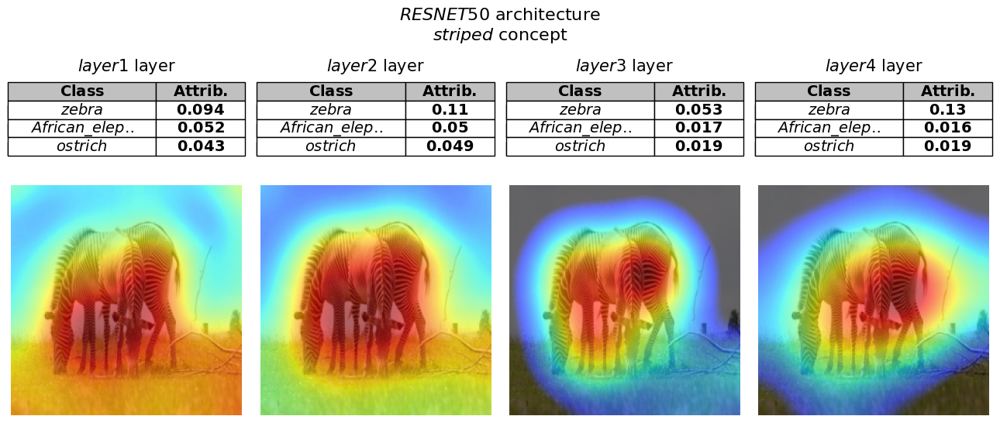

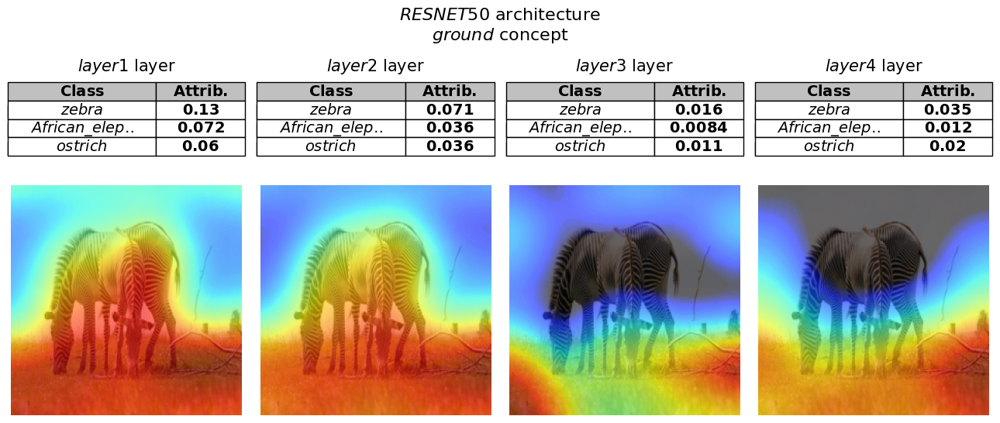

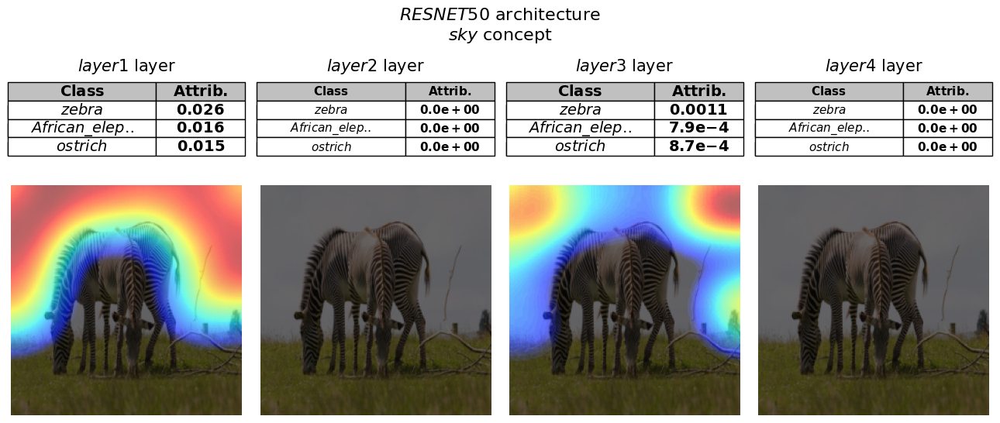

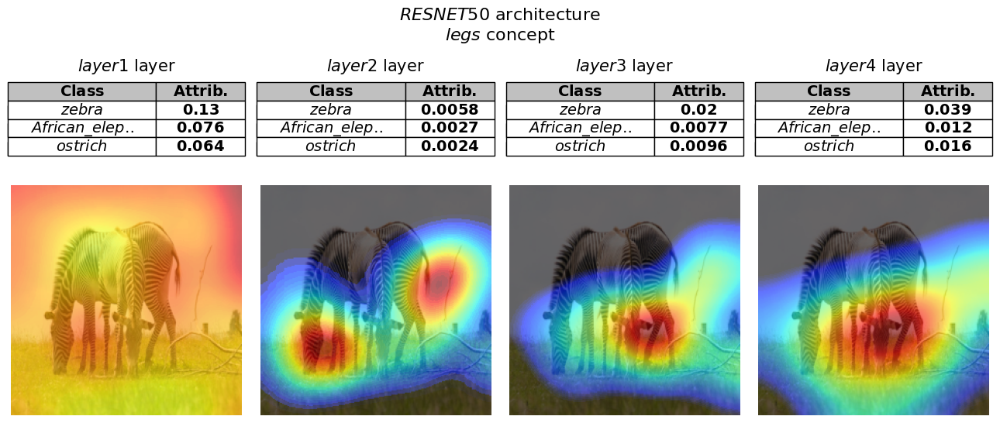

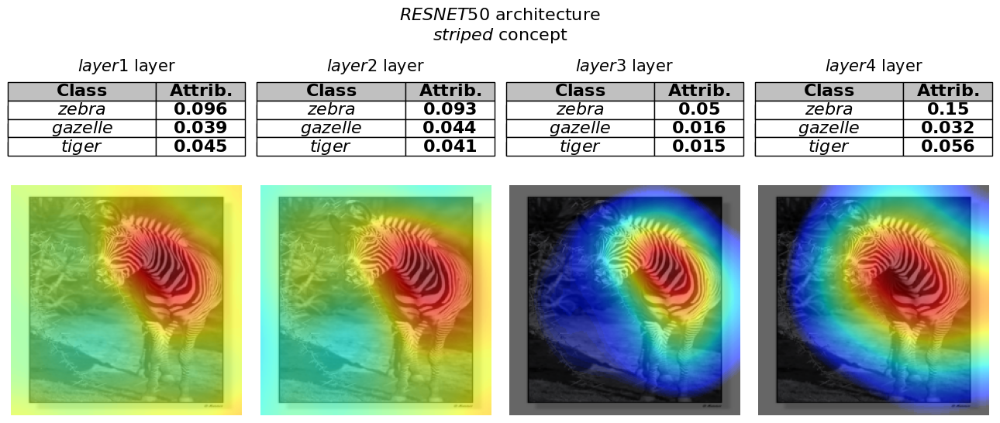

...

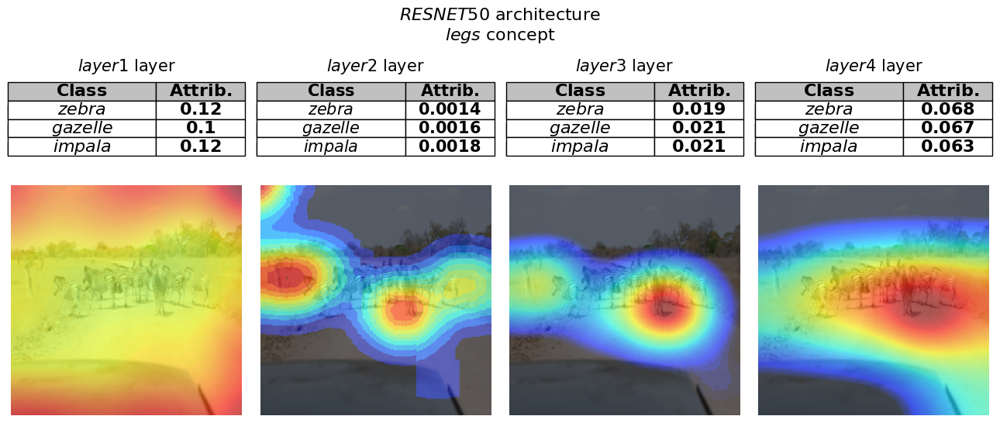

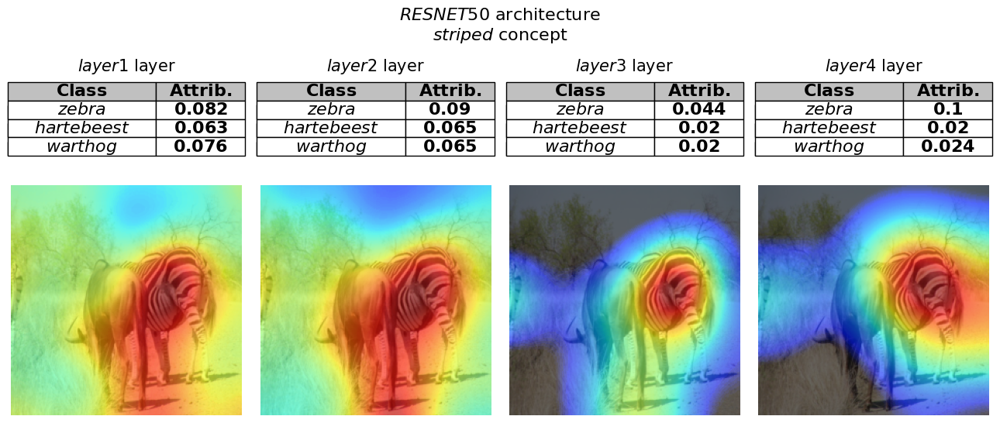

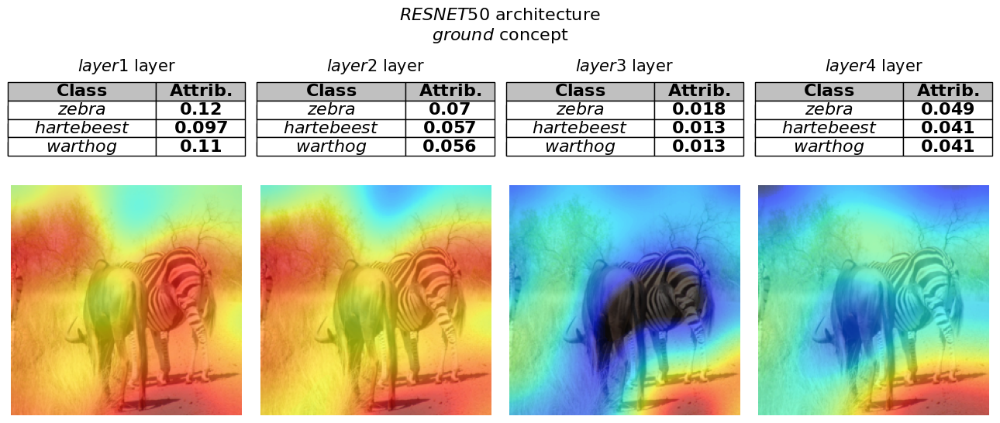

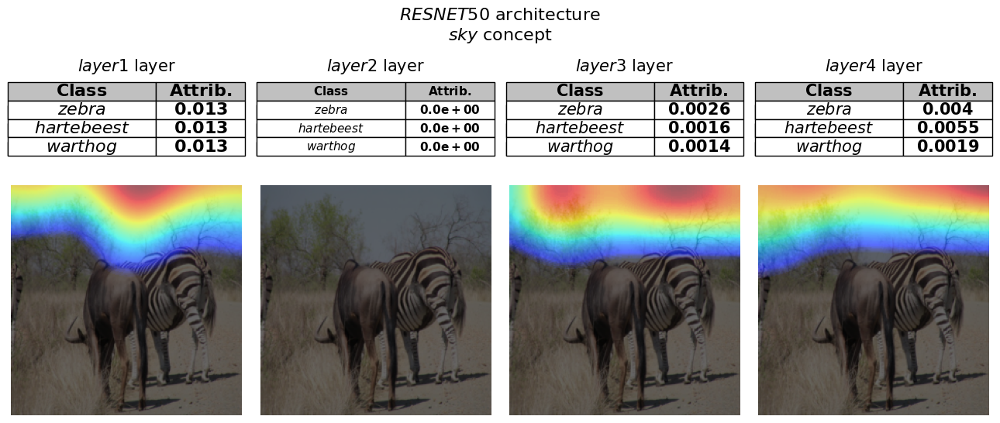

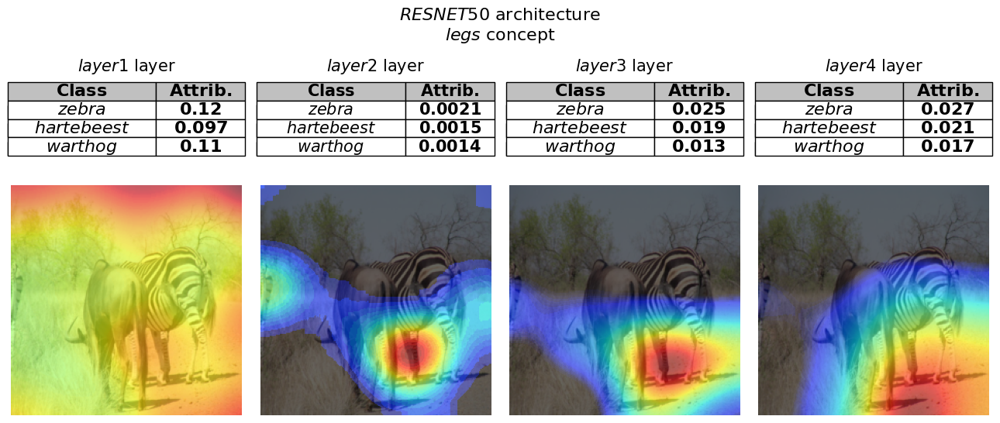

In [31]:
object_name = 'zebra'
target_concepts = ['striped', 'ground', 'sky','legs']
templates = original_templates #['an image of {} pattern', 'a photo of {} texture']

tcav.concepts =  target_concepts
tcav.layers = layers
image_index = 0
root = '/content/VISUAL_TCAV/Tcav/Torch_VisualTCAV/test_images/'
images = list_files_in_directory(f'{root}{object_name}/{object_name}')

for image_index in range(15,19):
  for layer_name in layers:
    text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_v4.pth')
    text_cav_dict = get_text_cav_dict(target_concepts,
                                      prompt_type='Subtract',
                                      k=1,
                                      when_subtract='Before',
                                      templates=templates)

    compute_attribution(object_name=object_name,
                        layer_name = layer_name,
                        image_index=image_index,
                        text_cav_dict=text_cav_dict,
                        )


  tcav_plot(tcav)



In [32]:
#Funzioni per ottenere il bounding box dalla concept map
#e tentare di capire se il concetto è presente o meno

import cv2
import numpy as np

def get_importance(image_name,concept):
  text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/{model_name}_{layer_name}_v3.pth')
  tcav.set_test_image(image_name)

  #FMAP From Model
  activation_vector = get_activation_vector(image_name, layer_name).unsqueeze(0)
  activation_vector = text_to_concept.linear_aligner.get_aligned_representation(activation_vector).detach().cpu()
  activation_vector /= activation_vector.norm(dim=-1, keepdim=True)

  prompts = get_prompts('', templates)
  baseline = get_text_cav(text_to_concept, prompts).detach().cpu()
  prompts = get_prompts(concept, templates)
  text_cav = get_text_cav(text_to_concept, prompts).detach().cpu()
  text_cav = text_cav

  similarity = activation_vector @ text_cav.T
  return float(similarity.squeeze().cpu())

def get_bounding_box(concept_map, threshold=0.5, all=True):
    """
    Ottiene il bounding box dalla concept map.

    Args:
        concept_map (np.array): Mappa di attivazione del concetto (heatmap).
        threshold (float): Soglia per binarizzare la mappa (valori > threshold sono attivati).

    Returns:
        tuple: Coordinate (x_min, y_min, x_max, y_max) del bounding box.
    """



    max_value = torch.max(concept_map).detach().cpu().numpy()


    # Normalizza la concept map tra 0 e 255
    heatmap = F.interpolate(
                concept_map.unsqueeze(0).unsqueeze(0),  # Aggiungi dimensioni per batch e canale
                size=(tcav.img.shape[0], tcav.img.shape[1]),
                mode='bilinear',
                align_corners=False
            )

    # Rimuovi le dimensioni extra per ottenere la heatmap nel formato desiderato
    heatmap = heatmap.squeeze().numpy()


    # Blurring
    heatmap = np.array(PIL.Image.fromarray(np.uint8(heatmap * 255), 'L').filter(
        PIL.ImageFilter.GaussianBlur(radius=21))) / 255

    if np.max(heatmap):
        heatmap = (heatmap / np.max(heatmap)) * max_value

    heatmap = np.uint8(heatmap * 255)


    # Binarizza la heatmap (tutti i valori sopra la soglia diventano 255)
    _, binary_map = cv2.threshold(heatmap, int(threshold * 255), 255, cv2.THRESH_BINARY)

    # Trova i contorni nella mappa binarizzata
    contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return None  # Nessuna area attiva trovata

    if not all:
      # Trova il contorno più grande
      largest_contour = max(contours, key=cv2.contourArea)

      # Ottieni il rettangolo che racchiude il contorno
      x, y, w, h = cv2.boundingRect(largest_contour)

      # Ritorna il bounding box (coordinate xmin, ymin, xmax, ymax)
      return [(x, y, w, h)]

    else:
      boxes = []
      for contour in contours:
        # Trova il rettangolo che racchiude il contorno
        x, y, w, h = cv2.boundingRect(contour)
        boxes.append((x, y, w, h))

      return boxes


def object_detection(concepts, layers, threshold=0.5,
                     check_if_present=False, only_top_box=False,
                     img_name=None, legend_loc='upper right'):
  colors = ['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'cyan']

  boxes = {l : {c: None for c in concepts} for l in layers}

  for layer_name in layers:
    for concept in concepts:
        concept_map = tcav.computations[layer_name][concept].concept_map

        if check_if_present and img_name is not None:
          importance = get_importance(img_name, concept)
          baseline = get_importance(img_name, '')
          if importance < baseline * 0.8:
            concept_map = torch.zeros_like(concept_map)

        boxes[layer_name][concept] = get_bounding_box(concept_map, all=not only_top_box, threshold=threshold)

  fig, axs = plt.subplots(1, len(layers) +1, figsize=(15, 5))
  axs[0].imshow(tcav.img)
  axs[0].axis('off')
  axs[0].set_title('Image')

  for j, layer_name in enumerate(layers):
    ax = axs[j+1]


    ax.imshow(tcav.img)
    ax.axis("off")
    ax.set_title(f'Layer: {layer_name}')

    for concept in concepts:
      bboxs = boxes[layer_name][concept]
      if bboxs is None:
        continue
      for bbox in bboxs:
        color = colors[concepts.index(concept) % len(colors)]
        if bbox:
            x_min, y_min, w, h = bbox
            x_max = x_min + w
            y_max = y_min + h
            ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                              edgecolor=color, facecolor='none', alpha=0.3,
                                      color=color, label=concept, linewidth=2))

            ax.text(x_min, y_min + 15, concept, color=color, fontsize=12, fontweight='bold',
                          bbox=dict(facecolor='white', alpha=0.7, edgecolor=color))


  if legend_loc != 'None':
    plt.legend(loc=legend_loc)
  plt.tight_layout()
  plt.show()

<ipython-input-78-277867fd8a26>:132: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,


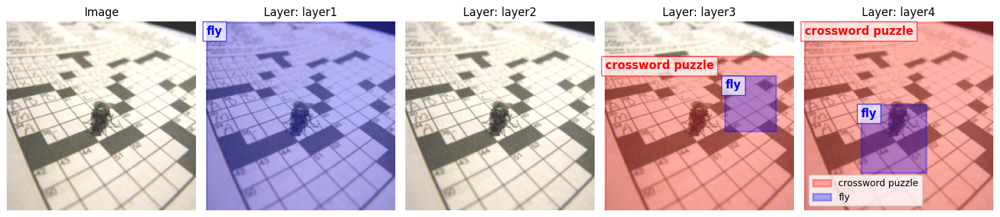

In [ ]:
object_name = 'crossword puzzle'
target_concepts = ['crossword puzzle', 'fly']
image_index = 13
image_name = f'{root}{object_name}/{object_name}/' + images[image_index]
for layer_name in layers:
  text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_v4.pth')
  text_cav_dict = get_text_cav_dict(target_concepts, prompt_type='Subtract', k=1, when_subtract='Before')
  compute_attribution(object_name=object_name,
                      image_index=image_index,
                      layer_name=layer_name,
                      text_cav_dict=text_cav_dict,
    )
tcav.concepts =  target_concepts
#tcav_plot(tcav)


object_detection(target_concepts,
                   layers,
                   threshold=0.5,
                   check_if_present=True,
                   only_top_box=False,
                   legend_loc = 'best',
                   img_name=image_name)

/content/VISUAL_TCAV/Tcav/TorchModel.py:415: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(inputs, dtype=torch.float32, requires_grad=True)
/tmp/ipython-input-1421542038.py:55: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  heatmap = np.array(PIL.Image.fromarray(np.uint8(heatmap * 255), 'L').filter(
/tmp/ipython-input-1421542038.py:135: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,


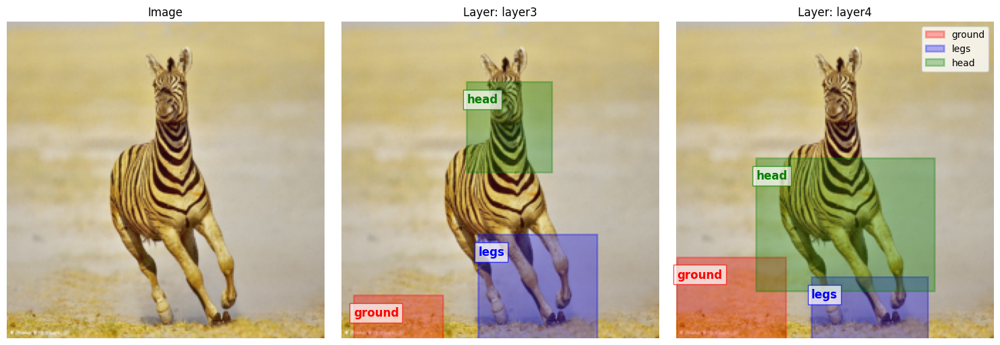

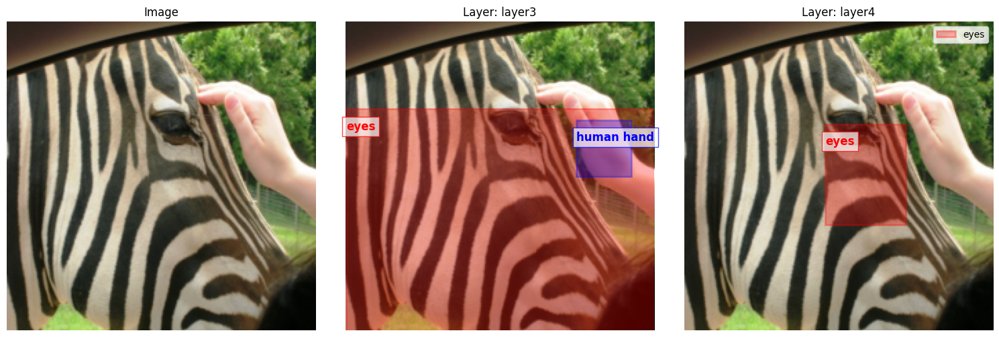

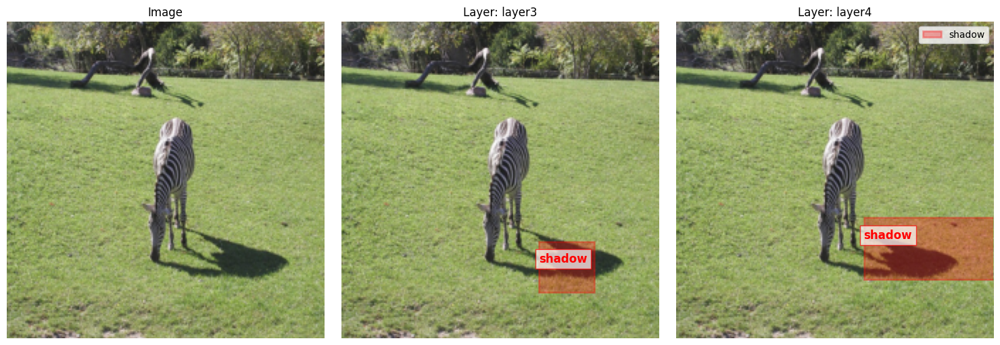

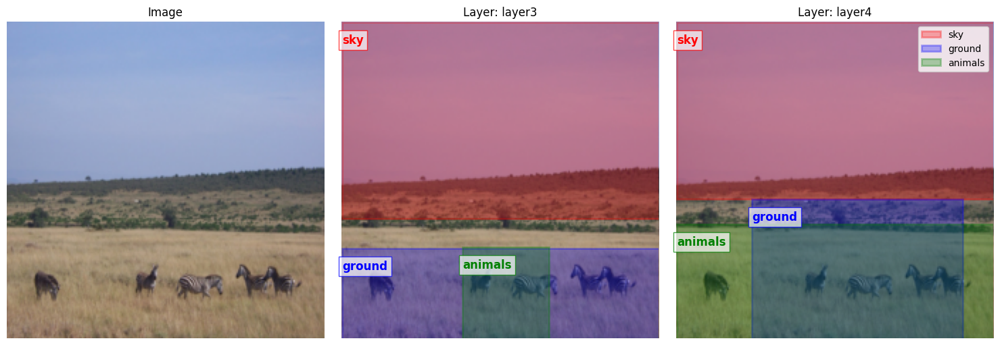

In [81]:
object_name = 'zebra'
target_concepts_dict = {1:['ground', 'legs', 'head'],
                        5: ['eyes', 'human hand'],
                        6: ['shadow'],
                        10: ['sky', 'ground', 'animals']
                        }
target_concepts = ['sky', 'ground', 'animals']
ths_list = {1: 0.5, 5: 0.8, 6: 0.8, 10: 0.5}
image_index = 10
indexes = [1, 5, 6, 10]
tcav.concepts =  target_concepts
#tcav_plot(tcav)

for image_index in indexes:
  image_name = f'{root}{object_name}/{object_name}/' + images[image_index]
  th = ths_list[image_index]

  for layer_name in layers[-2:]:
    target_concepts = target_concepts_dict[image_index]
    text_to_concept.load_linear_aligner(f'/content/VISUAL_TCAV/Text_to_Concept/aligners/CLIP_to_{model_name}_{layer_name}_v4.pth')
    text_cav_dict = get_text_cav_dict(target_concepts, prompt_type='Subtract', k=1, when_subtract='Before')
    compute_attribution(object_name=object_name,
                        image_index=image_index,
                        layer_name=layer_name,
                        text_cav_dict=text_cav_dict,
      )

  object_detection(target_concepts,
                    layers[-2:],
                    threshold=th,
                    check_if_present=True,
                    only_top_box=True,
                    legend_loc = 'best',
                    img_name=image_name)